# Imports

In [1]:
# System and Path Operations
import sys
import os
import datetime
from pathlib import Path
from glob import glob
sys.path.insert(0, '../')

# Imported Local Modules
from src.config import *
from src.utils import *
from src.metrices import *

# Setting seed for reproducibility
seed_value = 42
random.seed(seed_value)
np.random.seed(seed_value)
# tf.random.set_seed(seed_value)

# Deep Learning Libraries
from ultralytics import YOLO
import torch
from PIL import Image

# Computer Vision Libraries
import cv2
import shutil
import cv2 as cv
import os
import numpy as np
from skimage import io, img_as_ubyte
import matplotlib.pyplot as plt


2023-09-02 11:47:24.135833: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-09-02 11:47:24.179551: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-09-02 11:47:24.180639: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-02 11:47:25.166462: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


# Scoring
In this section it is possible to score the model of three diffrent sets of unseen images to assert generalization performances:
- SPARCS
- Biome
- 95 Clouds(without edge patches)

## Data loading

In [2]:
def load_cloud95(include_nir=True, invert_rgb=True, exclude_edge_patches=True, resize_to=256, for_visual_scoring=False):
    
    dataset = Cloud95Dataset(Cloud95_additional/'train_red_additional_to38cloud', 
                             Cloud95_additional/'train_green_additional_to38cloud', 
                             Cloud95_additional/'train_blue_additional_to38cloud', 
                             Cloud95_additional/'train_nir_additional_to38cloud',
                             Cloud95_additional/'train_gt_additional_to38cloud')
        
    if for_visual_scoring:
        X = np.array([dataset.open_as_array(idx, include_nir=False, false_color_aug=False, invert_rgb=False).astype(np.float32) for idx in range(3000)])
        y = np.array([dataset.open_mask(idx, add_dims=True).astype(np.int32) for idx in range(len(dataset))])
    else:
        X = np.array([dataset.open_as_array(idx, include_nir=include_nir, invert_rgb=invert_rgb).astype(np.float32) for idx in range(3000)])
        y = np.array([dataset.open_mask(idx, add_dims=True).astype(np.int32) for idx in range(len(dataset))])
        
    
    if exclude_edge_patches:
        non_zero_idxs = [index for index, img in enumerate(X) if not np.any(img == 0)]
        X, y = X[non_zero_idxs], y[non_zero_idxs]
    
    X = resize_image(X, new_dim=((X.shape[0], resize_to, resize_to, X.shape[-1])))
    y = resize_image(y, new_dim=((y.shape[0], resize_to, resize_to, y.shape[-1])))
    
    return X, y

In [3]:
def convert(images):
    # Convert the images from [0, 1] range to [0, 255] range
    images_uint8 = (images * 255).astype(np.uint8)
    
    # Rearrange the color channels from RGB to GBR
    images_gbr_uint8 = images_uint8[..., [1, 2, 0]]
    
    return images_gbr_uint8


def results_to_array(results):
    # Initialize an empty list to hold the individual masks
    individual_masks = []

    # Iterate through the results
    for result in results:
        if result.masks is None:
            # If no detection, add a zero mask
            individual_masks.append(np.zeros((256, 256), dtype=np.float32))
        else:
            # Sum up the binary masks along the first dimension (axis 0)
            combined_mask = torch.sum(result.masks.data, dim=0).cpu().numpy()
            individual_masks.append(combined_mask)

    # Convert the list of individual masks to a numpy array
    combined_masks_array = np.array(individual_masks)

    combined_masks_array = np.expand_dims(combined_masks_array, axis=-1)

    # Threshold the combined masks to create a binary mask
    binary_combined_masks = np.where(combined_masks_array > 0, 1, 0)
    
    return binary_combined_masks

In [4]:
# dataset = 'SPARCS'
dataset = 'Biome'
name = f'yolov8n_pre_epochs300_batch16_{dataset}'

my_model = YOLO(notebooks_path / f'runs/segment/{name}/weights/best.pt')

conf = 0.5

In [20]:
y_pred_sparcs = []
X_sparcs, y_sparcs = get_SPARCS('test', only_rgb=True)
X_sparcs = convert(X_sparcs)

for im in X_sparcs:
    res = list(my_model(im, conf=conf))
    y_pred_sparcs.append(np.squeeze(results_to_array(res), axis=0))
y_pred_sparcs = np.array(y_pred_sparcs)


y_pred_biome = []
X_biome, y_biome = get_biome8('test', only_rgb=True)
X_biome = convert(X_biome)

for im in X_biome:
    res = list(my_model(im, conf=conf))
    y_pred_biome.append(np.squeeze(results_to_array(res), axis=0))
y_pred_biome = np.array(y_pred_biome)


y_pred_95 = []
X_95, y_95 = load_cloud95(include_nir=False, invert_rgb=False, exclude_edge_patches=True)
X_95 = convert(X_95)

for im in X_95:
    res = list(my_model(im, conf=conf))
    y_pred_95.append(np.squeeze(results_to_array(res), axis=0))
y_pred_95 = np.array(y_pred_95)
y_pred_95.shape


0: 256x256 (no detections), 5.0ms
Speed: 0.7ms preprocess, 5.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.1ms
Speed: 0.7ms preprocess, 5.1ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 8.4ms
Speed: 0.9ms preprocess, 8.4ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.4ms
Speed: 0.6ms preprocess, 5.4ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.3ms
Speed: 0.6ms preprocess, 5.3ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.1ms
Speed: 0.6ms preprocess, 5.1ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.1ms
Speed: 0.6ms preprocess, 5.1ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 8.2ms
Speed: 1.0ms preprocess, 8.2ms inference, 0.3ms 

Loading data:  17%|█▋        | 638/3714 [00:01<00:06, 490.88it/s]

In [ ]:
y_pred_sparcs.shape, y_pred_biome.shape, y_pred_95.shape

((128, 256, 256, 1), (3714, 256, 256, 1), (13061, 256, 256, 1))

In [ ]:
np.unique(y_pred_sparcs), np.unique(y_pred_biome), np.unique(y_pred_95)

(array([0, 1]), array([0, 1]), array([0, 1]))

## Results

In [ ]:
print(f"\nSPARCS test set scores: ")
print_metrics(y_sparcs, y_pred_sparcs)

print(f"\nBiome8 test set scores: ")
print_metrics(y_biome, y_pred_biome)

print(f"\n95Cloud scores: ")
print_metrics(y_95, y_pred_95)

# Visual scoring
Here there is the possibility to perform a visual scoring on some unseen images and visually attest how good the model is masking the clouds.

In [5]:
def overlay(
    image: np.ndarray,
    mask: np.ndarray,
    color: Tuple[int, int, int] = (1, 0, 0),
    alpha: float = 0.5, 
    resize: Tuple[int, int] = None
) -> np.ndarray:
    """Combines image and its segmentation mask into a single image.
    
    Params:
        image: Training image.
        mask: Segmentation mask.
        color: Color for segmentation mask rendering.
        alpha: Segmentation mask's transparency.
        resize: If provided, both image and its mask are resized before blending them together.
    
    Returns:
        image_combined: The combined image.
        
    """
    color = np.asarray(color).reshape(1, 1, 3)  # Change color channel position
    colored_mask = np.expand_dims(mask, -1) * color
    image_overlay = image.copy()  # Make a copy of the image
    
    # Apply the overlay to the image
    image_overlay[mask > 0] = (1 - alpha) * image_overlay[mask > 0] + alpha * colored_mask[mask > 0]
    
    if resize is not None:
        image = cv.resize(image, resize[::-1])  # Reverse the order for resizing
        image_overlay = cv.resize(image_overlay, resize[::-1])
    
    image_combined = cv.addWeighted(image, 1 - alpha, image_overlay, alpha, 0)
    
    return image_combined


def save_images(ims: np.ndarray, preds: np.ndarray, gts: np.ndarray, dataset: str = None) -> None:
    output_folder = results_path / name / dataset
    print(output_folder)
    os.makedirs(output_folder, exist_ok=True)
    
    for i, (original_image, predicted_mask) in enumerate(zip(ims, preds)):

        gt_overlay = overlay(original_image, mask=gts[i].squeeze(), alpha=0.5, color=(0, 1, 0))
        gt_pred_overlay = overlay(gt_overlay, predicted_mask.squeeze(), alpha=0.5, color=(0, 0, 1))
        
        overlay_image = overlay(original_image, mask=np.squeeze(predicted_mask), alpha=0.5)
        
        # Convert images to uint8
        original_image = (original_image * 255).astype(np.uint8)
        predicted_mask = (predicted_mask * 255).astype(np.uint8)
        overlay_image = (overlay_image * 255).astype(np.uint8)
        gt_pred_overlay = (gt_pred_overlay * 255).astype(np.uint8)

        # Save the original image
        original_image_filename = os.path.join(output_folder, f'img_{i}_im.png')
        io.imsave(original_image_filename, original_image, check_contrast=False)

        # Save the overlay image
        overlay_image_filename = os.path.join(output_folder, f'img_{i}_over_1.png')
        io.imsave(overlay_image_filename, overlay_image, check_contrast=False)
        
        overlay_image_2_filename = os.path.join(output_folder, f'img_{i}_over_2.png')
        io.imsave(overlay_image_2_filename, gt_pred_overlay, check_contrast=False)

        # Save the predicted mask
        mask_filename = os.path.join(output_folder, f'img_{i}_pred.png')
        io.imsave(mask_filename, predicted_mask.squeeze(), check_contrast=False)

## Data loading

In [6]:
y_pred_sparcs = []
X_sparcs, y_sparcs = get_SPARCS('test', full_image=True, only_rgb=True, binary=True, resize_to=256)
X_sparcs_bgr = convert(X_sparcs)

for im in X_sparcs_bgr:
    res = list(my_model(im, conf=conf))
    y_pred_sparcs.append(np.squeeze(results_to_array(res), axis=0))
y_pred_sparcs = np.array(y_pred_sparcs)

save_images(X_sparcs, y_pred_sparcs, y_sparcs, dataset='SPARCS')


y_pred_biome = []
X_biome, y_biome = get_biome8('test', only_rgb=True, full_image=True, resize_to=256)
X_biome_bgr = convert(X_biome)

for im in X_biome_bgr:
    res = list(my_model(im, conf=conf))
    y_pred_biome.append(np.squeeze(results_to_array(res), axis=0))
y_pred_biome = np.array(y_pred_biome)

y_biome[y_biome == 2] = 0

save_images(X_biome, y_pred_biome, y_biome, dataset='Biome')


y_pred_95 = []
X_95, y_95 = load_cloud95(include_nir=False, invert_rgb=False, exclude_edge_patches=True)
X_95_bgr = convert(X_95)

for im in X_95_bgr:
    res = list(my_model(im, conf=conf))
    y_pred_95.append(np.squeeze(results_to_array(res), axis=0))
y_pred_95 = np.array(y_pred_95)

np.random.seed(12)
idxs = np.random.randint(X_95.shape[0], size=20)
X_95 = np.array([X_95[idx] for idx in idxs])
y_95 = np.array([y_95[idx] for idx in idxs])
y_pred_95 = np.array([y_pred_95[idx] for idx in idxs])

save_images(X_95, y_pred_95, y_95, dataset='95Cloud')


y_pred_sparcs.shape, y_pred_biome.shape, y_pred_95.shape


0: 256x256 (no detections), 8.2ms
Speed: 4.8ms preprocess, 8.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 8 clouds, 5.0ms
Speed: 0.7ms preprocess, 5.0ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.2ms
Speed: 0.6ms preprocess, 5.2ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.1ms
Speed: 0.6ms preprocess, 5.1ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.4ms
Speed: 0.6ms preprocess, 5.4ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.1ms
Speed: 0.6ms preprocess, 5.1ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.0ms
Speed: 0.7ms preprocess, 5.0ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 10.8ms
Speed: 1.0ms preprocess, 10.8ms inference, 0.5ms postprocess 

/home/floddo/cloud_coverage_TOELT_SUPSI/results/yolov8n_pre_epochs300_batch16_Biome/SPARCS


Loading data: 100%|██████████| 16/16 [00:03<00:00,  4.21it/s]

0: 256x256 (no detections), 6.3ms
Speed: 1.0ms preprocess, 6.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 4.9ms
Speed: 0.6ms preprocess, 4.9ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 8.2ms
Speed: 1.0ms preprocess, 8.2ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 4.9ms
Speed: 0.6ms preprocess, 4.9ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 8.1ms
Speed: 1.2ms preprocess, 8.1ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.5ms
Speed: 0.6ms preprocess, 6.5ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 4.9ms
Speed: 0.7ms preprocess, 4.9ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 4.9ms
Speed: 0.7

/home/floddo/cloud_coverage_TOELT_SUPSI/results/yolov8n_pre_epochs300_batch16_Biome/Biome



0: 256x256 (no detections), 6.7ms
Speed: 19.9ms preprocess, 6.7ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.8ms
Speed: 0.7ms preprocess, 7.8ms inference, 2.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.0ms
Speed: 0.6ms preprocess, 5.0ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 8.1ms
Speed: 1.0ms preprocess, 8.1ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.0ms
Speed: 0.7ms preprocess, 5.0ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.0ms
Speed: 0.6ms preprocess, 5.0ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 8.1ms
Speed: 1.2ms preprocess, 8.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.0ms
Speed: 0.6ms preprocess, 5.0ms inference, 0.3ms postprocess per

/home/floddo/cloud_coverage_TOELT_SUPSI/results/yolov8n_pre_epochs300_batch16_Biome/95Cloud


((8, 256, 256, 1), (16, 256, 256, 1), (20, 256, 256, 1))

## Results

In [7]:
y_sparcs.shape, y_biome.shape, y_95.shape

((8, 256, 256, 1), (16, 256, 256, 1), (20, 256, 256, 1))

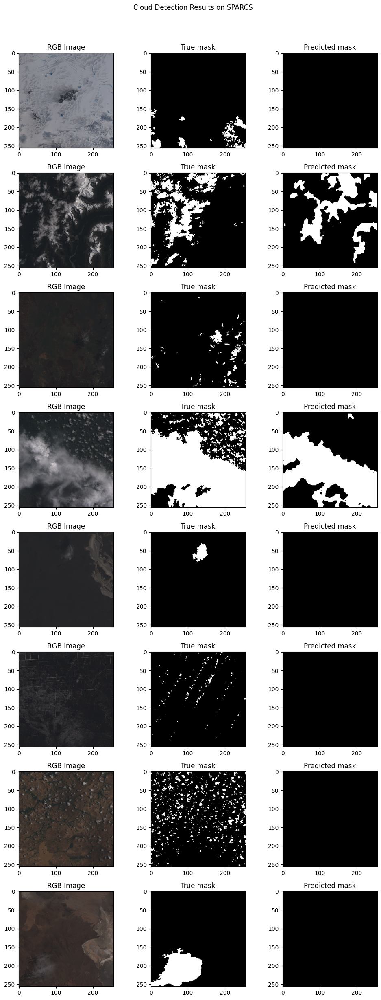

In [8]:
fig, ax = plt.subplots(len(X_sparcs), 3, figsize=(10, 25))

res_dir = results_path / name / 'SPARCS'
if not os.path.exists(res_dir):
        os.makedirs(res_dir, exist_ok=True)

for i, im in enumerate(X_sparcs):
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('RGB Image')
    ax[i, 1].imshow(y_sparcs[i], cmap='gray')
    ax[i, 1].set_title('True mask')
    ax[i, 2].imshow(y_pred_sparcs[i], cmap='gray')
    ax[i, 2].set_title('Predicted mask')
    
# Add a title for the entire plot
plt.suptitle('Cloud Detection Results on SPARCS')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_1.png'))

# Display the figure
plt.show()

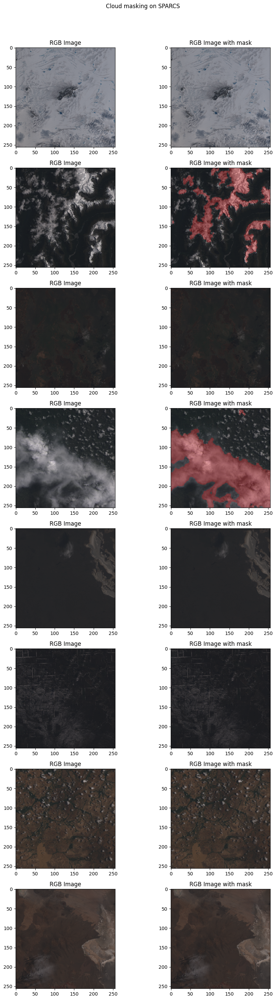

In [9]:
fig, ax = plt.subplots(len(X_sparcs), 2, figsize=(10, 30))


for i, im in enumerate(X_sparcs):
    # Remove singleton dimensions from preds[i]
    mask = np.squeeze(y_pred_sparcs[i])
    
    # Create an RGB mask where the masked region is light blue   
    cut_overlay = overlay(im, mask, alpha=0.5)
    
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('RGB Image')
    
    ax[i, 1].imshow(cut_overlay)
    # ax[i, 1].imshow(rgb_mask, alpha=0.3)  # Adjust alpha for desired transparency
    ax[i, 1].set_title('RGB Image with mask')
    
# Add a title for the entire plot
plt.suptitle('Cloud masking on SPARCS')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_2.png'))

# Display the figure
plt.show()

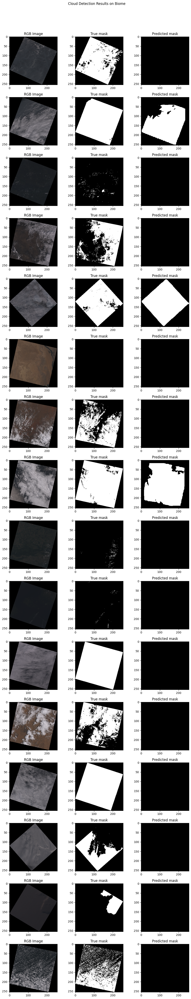

In [10]:
fig, ax = plt.subplots(len(X_biome), 3, figsize=(10, 50))

res_dir = results_path / name / 'Biome'
if not os.path.exists(res_dir):
        os.makedirs(res_dir, exist_ok=True)

for i, im in enumerate(X_biome):
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('RGB Image')
    ax[i, 1].imshow(y_biome[i], cmap='gray')
    ax[i, 1].set_title('True mask')
    ax[i, 2].imshow(y_pred_biome[i], cmap='gray')
    ax[i, 2].set_title('Predicted mask')

# Add a title for the entire plot
plt.suptitle('Cloud Detection Results on Biome')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_1.png'))

# # Display the figure
plt.show()

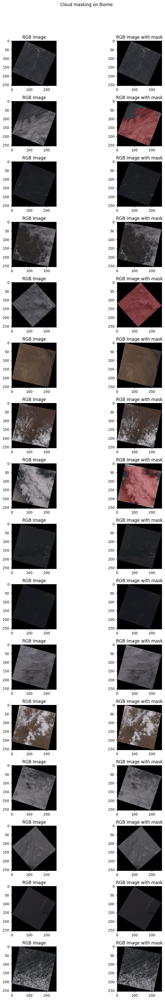

In [11]:
fig, ax = plt.subplots(len(X_biome), 2, figsize=(10, 40))

for i, im in enumerate(X_biome):
    # Remove singleton dimensions from preds[i]
    mask = np.squeeze(y_pred_biome[i])
    
    # Create an RGB mask where the masked region is light blue
    cut_overlay = overlay(im, mask, alpha=0.5)
    
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('RGB Image')
    
    ax[i, 1].imshow(cut_overlay)
    # ax[i, 1].imshow(im)
    # ax[i, 1].imshow(rgb_mask, alpha=0.7)  # Adjust alpha for desired transparency
    ax[i, 1].set_title('RGB Image with mask')
    
# Add a title for the entire plot
plt.suptitle('Cloud masking on Biome')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_2.png'))

# Display the figure
plt.show()

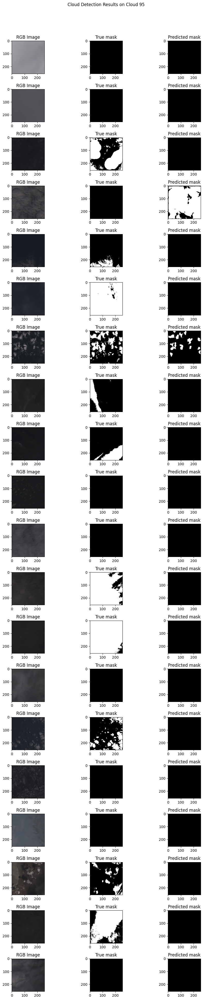

In [12]:
fig, ax = plt.subplots(len(X_95), 3, figsize=(10, 40))

res_dir = results_path / name / '95Cloud'
if not os.path.exists(res_dir):
        os.makedirs(res_dir, exist_ok=True)

for i, im in enumerate(X_95):
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('RGB Image')
    ax[i, 1].imshow(y_95[i], cmap='gray')
    ax[i, 1].set_title('True mask')
    ax[i, 2].imshow(y_pred_95[i], cmap='gray')
    ax[i, 2].set_title('Predicted mask')

# Add a title for the entire plot
plt.suptitle('Cloud Detection Results on Cloud 95')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_1.png'))

# # Display the figure
plt.show()

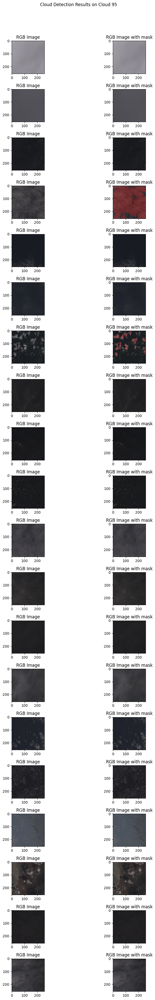

In [13]:
fig, ax = plt.subplots(len(X_95), 2, figsize=(10, 40))

for i, im in enumerate(X_95):
    
    mask = np.squeeze(y_pred_95[i])
    
    cut_overlay = overlay(im, mask, alpha=0.5)
    
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('RGB Image')
    
    ax[i, 1].imshow(cut_overlay)
    ax[i, 1].set_title('RGB Image with mask')

# Add a title for the entire plot
plt.suptitle('Cloud Detection Results on Cloud 95')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_2.png'))

# # Display the figure
plt.show()

# Video

In [14]:
def overlay(
    image: np.ndarray,
    mask: np.ndarray,
    color: Tuple[int, int, int] = (1, 0, 0),
    alpha: float = 0.5, 
    resize: Tuple[int, int] = None
) -> np.ndarray:
    """Combines image and its segmentation mask into a single image.
    
    Params:
        image: Training image.
        mask: Segmentation mask.
        color: Color for segmentation mask rendering.
        alpha: Segmentation mask's transparency.
        resize: If provided, both image and its mask are resized before blending them together.
    
    Returns:
        image_combined: The combined image.
        
    """
    color = np.asarray(color).reshape(1, 1, 3)  # Change color channel position
    colored_mask = np.expand_dims(mask, -1) * color
    image_overlay = image.copy()  # Make a copy of the image

    # print(image_overlay.shape, mask.shape, colored_mask.shape)
    
    # Apply the overlay to the image
    op1 = (1 - alpha) * image_overlay[mask > 0]
    op2 = alpha * colored_mask[mask > 0]
    image_overlay[mask > 0] = op1 + op2
    # image_overlay[mask > 0] = (1 - alpha) * image_overlay[mask > 0] + alpha * colored_mask[mask > 0]
    
    if resize is not None:
        image = cv.resize(image, resize[::-1])  # Reverse the order for resizing
        image_overlay = cv.resize(image_overlay, resize[::-1])
    
    image_combined = cv.addWeighted(image, 1 - alpha, image_overlay, alpha, 0)
    
    return image_combined


def predict_video_YOLO(video_path: str, model_filename: str, stack_frames: bool = False) -> np.ndarray:
    """Reads a video and returns its frames.
    
    Params:
        video_path: Path to the video.
        stack_frames: If True, the frames are stacked along the channel axis.
    
    Returns:
        video_frames: The video frames.
    
    """

    vs = cv.VideoCapture(video_path)

    if not vs.isOpened():
        print("Error: Could not open video capture.")
    else:
        print("Opened video capture.")

    _, frame = vs.read()
    H, W, _ = frame.shape
    vs.release()

    fourcc = cv.VideoWriter_fourcc('M','J','P','G')
    # out = cv.VideoWriter('output.avi', fourcc, 10, (W, H), True)
    if stack_frames:
        out = cv.VideoWriter(str(results_path / 'videos' / (model_filename.split('.')[0] + '_' + video_path.split("/")[-1].split(".")[0] + "_output.avi")), fourcc, 10, (W, H*2), True)
    else:
        out = cv.VideoWriter(str(results_path / 'videos' / (model_filename.split('.')[0] + '_' + video_path.split("/")[-1].split(".")[0] + "_output.avi")), fourcc, 10, (W, H), True)


    cap = cv.VideoCapture(video_path)
    idx = 0
    while True:
        ret, frame = cap.read()
        if ret == False:
            cap.release()
            out.release()
            break

        H, W, _ = frame.shape
        ori_frame = frame
        frame = cv.resize(frame, (256, 256))
        frame = np.expand_dims(frame, axis=0)
        # frame = frame / 255.0
        print(frame.shape)


        res = list(my_model(frame[0], conf=conf))
        mask = np.squeeze(results_to_array(res), axis=0)
        print(mask.shape, np.unique(mask))


        # mask = model.predict(frame)[0]
        mask = mask > 0.5

        print(mask.shape, np.unique(mask))

        mask = mask.astype(np.float32)
        mask = cv.resize(mask, (W, H))
        mask = np.expand_dims(mask, axis=-1)

        combine_frame = ori_frame * mask
        combine_frame = overlay(ori_frame, mask.squeeze(), color=(0, 255, 0), alpha=0.5)
        combine_frame = combine_frame.astype(np.uint8)

        if stack_frames:
            # Stack the original frame on top of the frame with overlay
            stacked_frame = np.vstack((ori_frame, combine_frame))

            cv.imwrite(f"video/{idx}.png", stacked_frame)
            idx += 1

            out.write(stacked_frame)
        else:

            cv.imwrite(f"video/{idx}.png", combine_frame)
            idx += 1

            out.write(combine_frame)

In [15]:
video_paths = [str(data_path / "videos/NASA_video_1.mp4"), 
                str(data_path / "videos/NASA_video_2.mp4"), 
                str(data_path / "videos/NASA_video_3.mp4"), 
                str(data_path / "videos/NASA_video_4.mp4")]

for video_path in video_paths:
    predict_video_YOLO(video_path, name, stack_frames=False)


0: 256x256 1 cloud, 10.5ms
Speed: 19.2ms preprocess, 10.5ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)


Opened video capture.
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 7.1ms
Speed: 0.9ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.6ms preprocess, 6.2ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 13.8ms
Speed: 0.6ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 2 clouds, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 3 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 3 clouds, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 2 clouds, 6.0ms
Speed: 0.5ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 8.6ms
Speed: 0.7ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 4 clouds, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 3 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 4 clouds, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 2 clouds, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 7.3ms
Speed: 0.8ms preprocess, 7.3ms inference, 2.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 7.2ms
Speed: 3.4ms preprocess, 7.2ms inference, 2.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 3 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 3 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.4ms
Speed: 0.6ms preprocess, 6.4ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.1ms
Speed: 1.0ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 3 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 6.3ms
Speed: 0.6ms preprocess, 6.3ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 6.2ms
Speed: 0.8ms preprocess, 6.2ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 6.3ms
Speed: 0.6ms preprocess, 6.3ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 7.2ms
Speed: 0.8ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 9.1ms
Speed: 0.7ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 10.9ms
Speed: 1.0ms preprocess, 10.9ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)



0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.3ms
Speed: 0.6ms preprocess, 6.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.5ms
Speed: 0.6ms preprocess, 6.5ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 7.3ms
Speed: 0.8ms preprocess, 7.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 1.0ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]



0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 2 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 1.0ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)



0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 6.5ms
Speed: 0.6ms preprocess, 6.5ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.5ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 15.1ms
Speed: 0.7ms preprocess, 15.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 6.3ms
Speed: 0.8ms preprocess, 6.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 6.5ms
Speed: 0.7ms preprocess, 6.5ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 10.6ms
Speed: 1.0ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.3ms
Speed: 0.8ms preprocess, 6.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 7.3ms
Speed: 0.7ms preprocess, 7.3ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.1ms
Speed: 0.9ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 7.3ms
Speed: 0.9ms preprocess, 7.3ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
Opened video capture.



0: 256x256 (no detections), 9.1ms
Speed: 0.8ms preprocess, 9.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 8.1ms
Speed: 0.5ms preprocess, 8.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 13.3ms preprocess, 5.7ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.1ms
Speed: 0.6ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 1 cloud, 5.8ms
Speed: 1.0ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 3 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 3 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 3 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 1.0ms preprocess, 5.9ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 3 clouds, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.4ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 2 clouds, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 13.8ms
Speed: 0.8ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 10.5ms
Speed: 0.7ms preprocess, 10.5ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 3 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 3 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 3 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 2 clouds, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 2 clouds, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 10.7ms
Speed: 1.0ms preprocess, 10.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 4 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 4 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 10.4ms
Speed: 0.7ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 6.0ms
Speed: 0.9ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 4 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 4 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 4 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.5ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.4ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.1ms
Speed: 0.5ms preprocess, 6.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.5ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.4ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.8ms
Speed: 1.0ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.1ms
Speed: 0.8ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.6ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 10.5ms
Speed: 0.7ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 8.7ms
Speed: 2.1ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 2.2ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.2ms
Speed: 0.7ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.7ms
Speed: 0.8ms preprocess, 6.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.4ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 10.6ms
Speed: 1.2ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 10.5ms
Speed: 1.1ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.5ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.5ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.6ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.5ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.9ms preprocess, 6.0ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.7ms
Speed: 0.6ms preprocess, 6.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 1.1ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 1.1ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 9.3ms
Speed: 0.7ms preprocess, 9.3ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.9ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 13.3ms
Speed: 0.9ms preprocess, 13.3ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 20.4ms
Speed: 0.8ms preprocess, 20.4ms inference, 2.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 8.1ms
Speed: 0.6ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.8ms preprocess, 6.3ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 8.1ms
Speed: 0.7ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.9ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 24.8ms
Speed: 0.7ms preprocess, 24.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.1ms
Speed: 0.8ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 6.8ms
Speed: 0.7ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 7.2ms
Speed: 0.9ms preprocess, 7.2ms inference, 2.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 8.8ms
Speed: 0.9ms preprocess, 8.8ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 7.1ms
Speed: 0.8ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 13.4ms
Speed: 0.6ms preprocess, 13.4ms inference, 2.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.5ms
Speed: 3.5ms preprocess, 6.5ms inference, 2.3ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 1.2ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.5ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 1.3ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.6ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.4ms
Speed: 0.7ms preprocess, 6.4ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.9ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 6.3ms
Speed: 0.9ms preprocess, 6.3ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.4ms
Speed: 0.9ms preprocess, 6.4ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.4ms
Speed: 0.7ms preprocess, 6.4ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.4ms
Speed: 0.7ms preprocess, 6.4ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.4ms
Speed: 0.8ms preprocess, 6.4ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.5ms
Speed: 0.8ms preprocess, 6.5ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 2.2ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.9ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.4ms
Speed: 0.7ms preprocess, 6.4ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.8ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.4ms
Speed: 0.7ms preprocess, 6.4ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 7.6ms
Speed: 0.9ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.8ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.8ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.6ms
Speed: 0.7ms preprocess, 6.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 7.2ms
Speed: 0.7ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.9ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 1.1ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.1ms
Speed: 0.6ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.5ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 1.1ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.1ms
Speed: 0.8ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 18.9ms
Speed: 0.8ms preprocess, 18.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.4ms
Speed: 0.7ms preprocess, 6.4ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.4ms
Speed: 0.8ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 1.1ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 7.2ms
Speed: 0.7ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.0ms
Speed: 0.6ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.1ms
Speed: 0.7ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.9ms
Speed: 0.5ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 7.3ms
Speed: 0.8ms preprocess, 7.3ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.8ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.4ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 2.2ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.4ms
Speed: 0.7ms preprocess, 6.4ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.4ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.4ms
Speed: 0.7ms preprocess, 6.4ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.8ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.5ms
Speed: 0.9ms preprocess, 6.5ms inference, 2.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 8.7ms
Speed: 0.8ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 1.1ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.2ms
Speed: 0.5ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 4.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.8ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.8ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.9ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.9ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 2.2ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 1.1ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 9.3ms
Speed: 0.7ms preprocess, 9.3ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.6ms preprocess, 6.2ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.5ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 7.1ms
Speed: 0.6ms preprocess, 7.1ms inference, 2.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.4ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.4ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.8ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.9ms preprocess, 5.9ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.8ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 1.1ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 8.1ms
Speed: 0.8ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.1ms
Speed: 3.9ms preprocess, 7.1ms inference, 2.3ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.6ms preprocess, 6.2ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 2.2ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.7ms
Speed: 0.7ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.1ms
Speed: 0.8ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.5ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 7.7ms
Speed: 0.8ms preprocess, 7.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


Opened video capture.
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 14.1ms
Speed: 0.6ms preprocess, 14.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 0.5ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 7.1ms
Speed: 0.7ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.1ms
Speed: 0.7ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.1ms
Speed: 0.6ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 13.6ms
Speed: 0.6ms preprocess, 13.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 7.4ms
Speed: 0.6ms preprocess, 7.4ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 3 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 3 clouds, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 8.1ms
Speed: 0.5ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 3 clouds, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 10.9ms
Speed: 1.1ms preprocess, 10.9ms inference, 2.2ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 3 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 2 clouds, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 10.6ms
Speed: 0.7ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 (no detections), 5.9ms
Speed: 0.5ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 3 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 3 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 10.6ms
Speed: 1.1ms preprocess, 10.6ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 3 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 4 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 4 clouds, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 3 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 4 clouds, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 4 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 4 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 10.6ms
Speed: 1.4ms preprocess, 10.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 2 clouds, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 7.2ms
Speed: 0.6ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 8.0ms
Speed: 0.6ms preprocess, 8.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 7.1ms
Speed: 0.8ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.0ms
Speed: 0.9ms preprocess, 6.0ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.1ms
Speed: 0.7ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 8.6ms
Speed: 0.6ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 7.1ms
Speed: 0.6ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 8.6ms
Speed: 0.7ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 10.7ms
Speed: 0.9ms preprocess, 10.7ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 7.1ms
Speed: 0.6ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.4ms
Speed: 0.8ms preprocess, 6.4ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.2ms
Speed: 0.9ms preprocess, 6.2ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 7.4ms
Speed: 0.6ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.9ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.0ms
Speed: 0.5ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.6ms
Speed: 0.8ms preprocess, 6.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.2ms
Speed: 0.8ms preprocess, 6.2ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 10.5ms
Speed: 0.6ms preprocess, 10.5ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 2.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.5ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 13.8ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 1.1ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 20.4ms
Speed: 0.7ms preprocess, 20.4ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.5ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 14.2ms
Speed: 0.6ms preprocess, 14.2ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.5ms preprocess, 6.0ms inference, 9.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.3ms
Speed: 0.6ms preprocess, 6.3ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.9ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 10.9ms
Speed: 1.0ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.5ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.8ms preprocess, 6.2ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.8ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.4ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 1.1ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.4ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 1.1ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.8ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 8.2ms
Speed: 0.8ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.4ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.8ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 10.8ms
Speed: 1.2ms preprocess, 10.8ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 11.0ms
Speed: 1.0ms preprocess, 11.0ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 10.5ms
Speed: 0.9ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 2.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 4.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.8ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.8ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.5ms preprocess, 5.9ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.8ms preprocess, 6.2ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 10.8ms
Speed: 1.0ms preprocess, 10.8ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 1.1ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.4ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 1.0ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 10.6ms
Speed: 1.1ms preprocess, 10.6ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.1ms
Speed: 0.9ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.1ms
Speed: 0.9ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.8ms
Speed: 0.9ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 8.2ms
Speed: 0.8ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.5ms
Speed: 0.6ms preprocess, 6.5ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.8ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 6.0ms
Speed: 0.5ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 13.5ms
Speed: 0.7ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.5ms preprocess, 6.1ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.2ms
Speed: 0.8ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.7ms
Speed: 0.9ms preprocess, 6.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.4ms
Speed: 0.8ms preprocess, 6.4ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.8ms preprocess, 6.2ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 1.1ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.5ms preprocess, 5.9ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.9ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.9ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.0ms
Speed: 0.8ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 1.1ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 1.1ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 1.1ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 15.6ms
Speed: 0.8ms preprocess, 15.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.4ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.8ms preprocess, 6.3ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 8.7ms
Speed: 0.7ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 7.3ms
Speed: 0.9ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.4ms
Speed: 0.7ms preprocess, 6.4ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 10.2ms
Speed: 0.5ms preprocess, 10.2ms inference, 2.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 9.3ms
Speed: 3.5ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.3ms
Speed: 0.6ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 1.1ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 10.8ms
Speed: 1.0ms preprocess, 10.8ms inference, 2.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 7.1ms
Speed: 0.8ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.2ms
Speed: 0.6ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 6.4ms
Speed: 0.6ms preprocess, 6.4ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 7.4ms
Speed: 0.6ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 8.2ms
Speed: 0.9ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.1ms
Speed: 0.6ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.2ms
Speed: 0.7ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.6ms inference, 4.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.1ms
Speed: 0.7ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.9ms
Speed: 0.9ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.3ms


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 7.3ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 10.7ms
Speed: 0.7ms preprocess, 10.7ms inference, 2.8ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 2.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 8.7ms
Speed: 0.8ms preprocess, 8.7ms inference, 2.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.2ms


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.8ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.0ms
Speed: 1.0ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.6ms inference, 3.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 1.0ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 7.9ms
Speed: 0.7ms preprocess, 7.9ms inference, 2.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 10.7ms
Speed: 0.8ms preprocess, 10.7ms inference, 2.3ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.2ms
Speed: 0.6ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.2ms
Speed: 0.7ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 7.1ms
Speed: 0.7ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 9.3ms
Speed: 0.6ms preprocess, 9.3ms inference, 2.3ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 7.8ms
Speed: 0.6ms preprocess, 7.8ms inference, 2.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 8.6ms
Speed: 0.6ms preprocess, 8.6ms inference, 2.4ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 7.6ms
Speed: 0.8ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 7.4ms
Speed: 0.8ms preprocess, 7.4ms inference, 2.2ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 1.2ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.1ms
Speed: 0.7ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.9ms
Speed: 0.5ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.4ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
Opened video capture.



0: 256x256 (no detections), 7.8ms
Speed: 0.7ms preprocess, 7.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.5ms
Speed: 0.7ms preprocess, 6.5ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.9ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.1ms
Speed: 0.6ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.1ms
Speed: 0.7ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 7.3ms
Speed: 0.6ms preprocess, 7.3ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]



0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.1ms
Speed: 0.7ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 10.1ms
Speed: 0.7ms preprocess, 10.1ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 7.6ms
Speed: 0.8ms preprocess, 7.6ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.4ms
Speed: 0.7ms preprocess, 7.4ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.3ms
Speed: 0.8ms preprocess, 7.3ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.2ms
Speed: 0.6ms preprocess, 7.2ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.1ms
Speed: 0.6ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.9ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.0ms
Speed: 3.5ms preprocess, 7.0ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.4ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 10.3ms
Speed: 0.7ms preprocess, 10.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 10.5ms
Speed: 0.8ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.0ms
Speed: 0.7ms preprocess, 7.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.7ms
Speed: 0.8ms preprocess, 6.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 10.5ms
Speed: 1.1ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 10.7ms
Speed: 1.0ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.4ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 1.1ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.2ms
Speed: 1.2ms preprocess, 6.2ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.4ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 8.1ms
Speed: 0.8ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 10.6ms
Speed: 0.7ms preprocess, 10.6ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 2 clouds, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.4ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.4ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 2 clouds, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 2 clouds, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.4ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 9.2ms
Speed: 1.2ms preprocess, 9.2ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 7.1ms
Speed: 0.8ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 7.1ms
Speed: 0.7ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.0ms
Speed: 0.9ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.4ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 13.5ms
Speed: 0.7ms preprocess, 13.5ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.1ms
Speed: 0.7ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.1ms
Speed: 0.6ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.1ms
Speed: 0.8ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.1ms
Speed: 1.1ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 1.1ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 7.3ms
Speed: 0.8ms preprocess, 7.3ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.1ms
Speed: 0.6ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.9ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.1ms
Speed: 0.8ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.2ms
Speed: 0.7ms preprocess, 7.2ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 11.1ms
Speed: 0.7ms preprocess, 11.1ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 1.0ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.4ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 10.3ms
Speed: 1.1ms preprocess, 10.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.5ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 8.8ms
Speed: 0.7ms preprocess, 8.8ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 8.4ms
Speed: 0.6ms preprocess, 8.4ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 4.2ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.2ms
Speed: 0.8ms preprocess, 6.2ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.0ms
Speed: 0.6ms preprocess, 7.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 1 cloud, 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.4ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.5ms preprocess, 5.9ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 0.9ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.4ms
Speed: 0.5ms preprocess, 6.4ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 10.8ms
Speed: 1.0ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 6.8ms
Speed: 0.9ms preprocess, 6.8ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 8.5ms
Speed: 0.8ms preprocess, 8.5ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.3ms
Speed: 0.8ms preprocess, 6.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.3ms
Speed: 0.8ms preprocess, 6.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 9.2ms
Speed: 0.7ms preprocess, 9.2ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.3ms
Speed: 0.7ms preprocess, 6.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 8.1ms
Speed: 0.8ms preprocess, 8.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.5ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


Speed: 0.4ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.9ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 8.8ms
Speed: 0.8ms preprocess, 8.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.3ms
Speed: 0.8ms preprocess, 6.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.4ms
Speed: 0.8ms preprocess, 6.4ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 9.8ms
Speed: 1.0ms preprocess, 9.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.3ms
Speed: 0.9ms preprocess, 6.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 2.8ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.9ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 1.0ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.2ms
Speed: 0.9ms preprocess, 6.2ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 1.0ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 6.4ms
Speed: 0.6ms preprocess, 6.4ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.6ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)



0: 256x256 (no detections), 5.9ms
Speed: 0.5ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.4ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 1 cloud, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 8.5ms
Speed: 0.8ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.4ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.8ms
Speed: 0.4ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 8.0ms
Speed: 1.6ms preprocess, 8.0ms inference, 2.3ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 8.5ms
Speed: 1.1ms preprocess, 8.5ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.3ms
Speed: 1.1ms preprocess, 6.3ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.4ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


Speed: 0.8ms preprocess, 5.8ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.4ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.6ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.9ms
Speed: 3.5ms preprocess, 6.9ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.5ms
Speed: 0.7ms preprocess, 6.5ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 10.9ms
Speed: 0.9ms preprocess, 10.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.7ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 8.4ms
Speed: 0.8ms preprocess, 8.4ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 5.6ms
Speed: 1.1ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.4ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 10.6ms
Speed: 0.9ms preprocess, 10.6ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.9ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.6ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]



0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 10.6ms
Speed: 1.1ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.4ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.4ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 10.6ms
Speed: 1.1ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 1.1ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.6ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.4ms
Speed: 0.6ms preprocess, 7.4ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.1ms
Speed: 0.8ms preprocess, 6.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.8ms
Speed: 0.9ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 7.3ms
Speed: 0.7ms preprocess, 7.3ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.0ms
Speed: 0.7ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 6.9ms
Speed: 0.7ms preprocess, 6.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)



0: 256x256 (no detections), 5.7ms
Speed: 0.5ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.4ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.1ms
Speed: 0.7ms preprocess, 6.1ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 10.6ms
Speed: 1.1ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 256)



(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 6.2ms
Speed: 0.7ms preprocess, 6.2ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.4ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


0: 256x256 (no detections), 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)


Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.9ms
Speed: 0.8ms preprocess, 5.9ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 (no detections), 6.0ms
Speed: 0.8ms preprocess, 6.0ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.7ms
Speed: 0.8ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)



(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)


0: 256x256 (no detections), 5.6ms
Speed: 1.2ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 14.4ms
Speed: 0.8ms preprocess, 14.4ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.8ms
Speed: 0.7ms preprocess, 5.8ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]



0: 256x256 1 cloud, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 1 cloud, 5.6ms
Speed: 0.5ms preprocess, 5.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]



0: 256x256 1 cloud, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.6ms
Speed: 0.7ms preprocess, 5.6ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)

0: 256x256 (no detections), 5.7ms
Speed: 0.7ms preprocess, 5.7ms inference, 0.4ms postprocess per image at shape (1, 3, 256, 256)


(1, 256, 256, 3)
(256, 256, 1) [0 1]
(256, 256, 1) [False  True]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
(1, 256, 256, 3)
(256, 256, 1) [0]
(256, 256, 1) [False]
